In [1]:
#Importing the Gadfly package for use in this notebook
using Gadfly

# Gadfly
+ Simple plotting (introducing Gadfly)
+ Add layers
+ Use *Themes*
+ Add titles and axes labels
+ Save plots
+ Plotting from *DataFrames*
    + Box and whisker plots
    + Histograms
    + Violin plots
    + QQ plots
    + Scatter plots
    + Vertical and horizontal lines
+ Some more examples

## Simple plots

In [3]:
# Create 100 x-coordinate and 100 y-coordinate points, each value drawn at random from
# the standard normal distribution using the rand() function
xvals = rand(100)
yvals = rand(100)

100-element Array{Float64,1}:
 0.488314 
 0.435441 
 0.914738 
 0.17899  
 0.676384 
 0.818367 
 0.92915  
 0.244902 
 0.22687  
 0.893099 
 0.635983 
 0.385661 
 0.437475 
 ⋮        
 0.0421508
 0.531898 
 0.689309 
 0.0999926
 0.115081 
 0.560719 
 0.0530976
 0.0324645
 0.241588 
 0.802479 
 0.968212 
 0.225887 

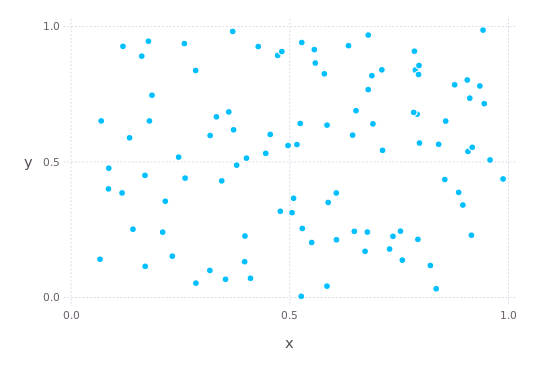

In [4]:
# Invoking the plot() function from Gadfly
# When we only pass two arguments (x and y) it results in a scatter plot (the geometry is taken as 'Geom.point')
# The x and y arguments are referred to as aesthetics
plot(x = xvals, y = yvals)

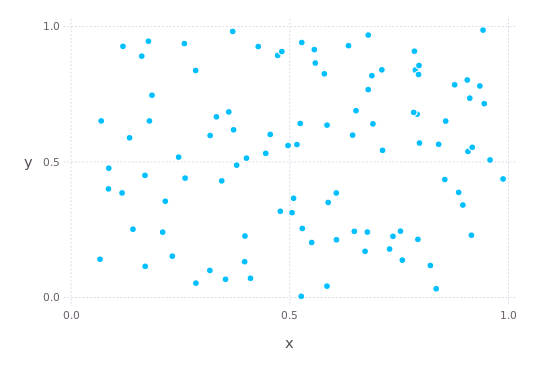

In [5]:
# Actually specifying the geomtery as points (which was done by default in the previous example)
# The point geometry takes the input x- and y-aesthetics
plot(x = xvals, y = yvals, Geom.point)

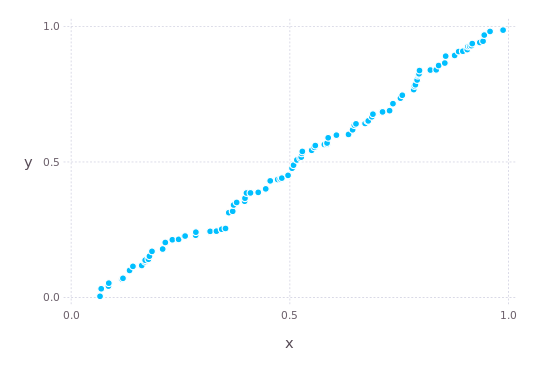

In [6]:
# Using the sort function (which changes the correlation complete)
plot(x = sort(xvals), y = sort(yvals))

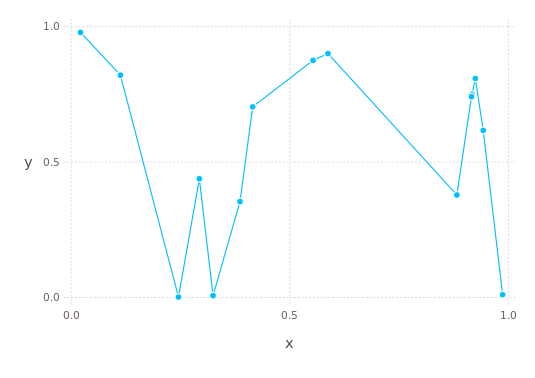

In [7]:
# Adding another geomtery, which in this case is a line connecting the points
# The point and line geometries act on the same input data
xvals2 = rand(15)
yvals2 = rand(15)
plot(x = xvals2, y = yvals2, Geom.point, Geom.line)

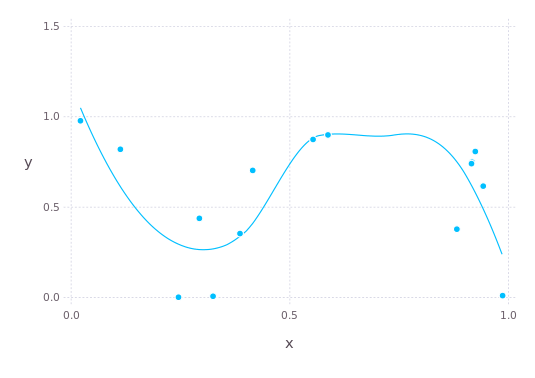

In [8]:
# We can also smooth out the line
plot(x = xvals2, y = yvals2, Geom.point, Geom.smooth)

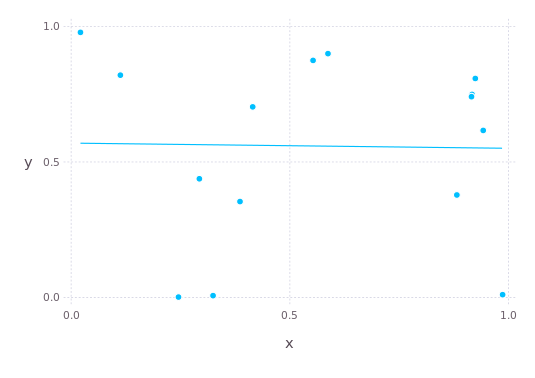

In [9]:
# Different model for the line
plot(x = xvals2, y = yvals2, Geom.point, Geom.smooth(method = :lm))

## Adding layers

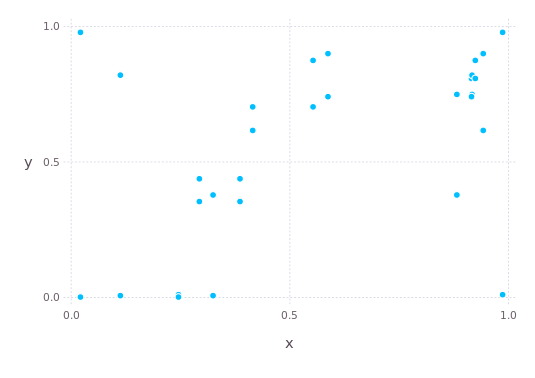

In [10]:
# Adding layer using the layer() function
# The geometry has to be specified now
plot(layer(x = xvals2, y = yvals2, Geom.point), layer(x = sort(xvals2), y = sort(yvals2), Geom.point))

## Using themes

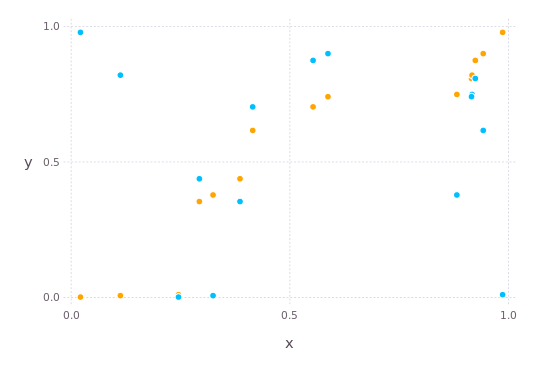

In [11]:
# It was not clear from the plot above that we were plotting two layers
plot(layer(x = xvals2, y = yvals2, Geom.point),
layer(x = sort(xvals2), y = sort(yvals2), Geom.point, Theme(default_color = colorant"orange")))

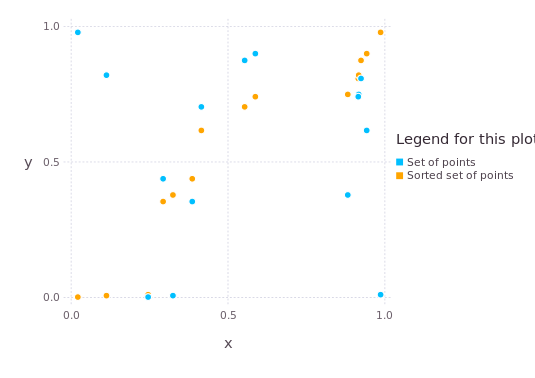

In [12]:
# Another way of doing layers
# Adding a legend
points1 = layer(x = xvals2, y = yvals2, Geom.point, Theme(default_color = colorant"deepskyblue"))
points2 = layer(x = sort(xvals2), y = sort(yvals2), Geom.point, Theme(default_color = colorant"orange"))
plot(points1, points2, Guide.manual_color_key("Legend for this plot",
["Set of points", "Sorted set of points"], ["deepskyblue", "orange"]))

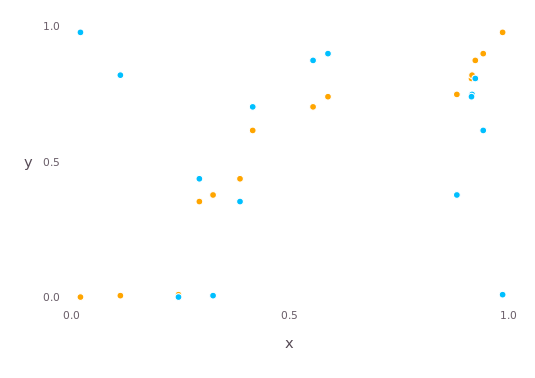

In [13]:
# Changing the grid color
plot(layer(x = xvals2, y = yvals2, Geom.point),
layer(x = sort(xvals2), y = sort(yvals2), Geom.point, Theme(default_color = colorant"orange")),
Theme(grid_color = colorant"white"))

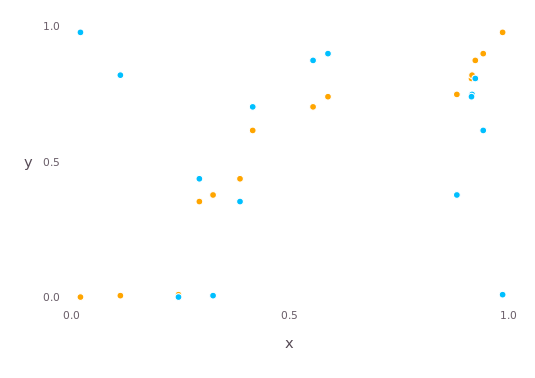

In [14]:
# Removing the pop-up (mouse-over) grid by changing its color to white too
plot(layer(x = xvals2, y = yvals2, Geom.point),
layer(x = sort(xvals2), y = sort(yvals2), Geom.point, Theme(default_color = colorant"orange")),
Theme(grid_color = colorant"white", grid_color_focused = colorant"white"))

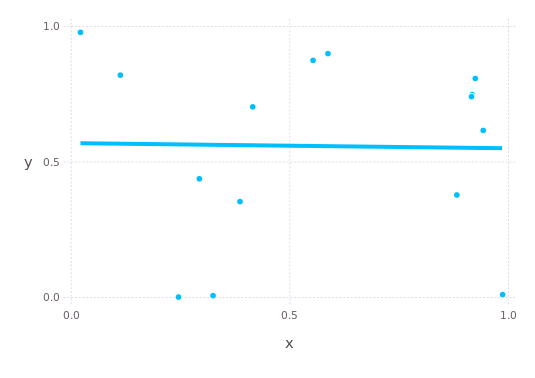

In [15]:
# Changing the size (stroke thickness) of the line
# Changing the line model
plot(x = xvals2, y = yvals2, Geom.point, Geom.smooth(method = :lm), Theme(line_width = 4px))

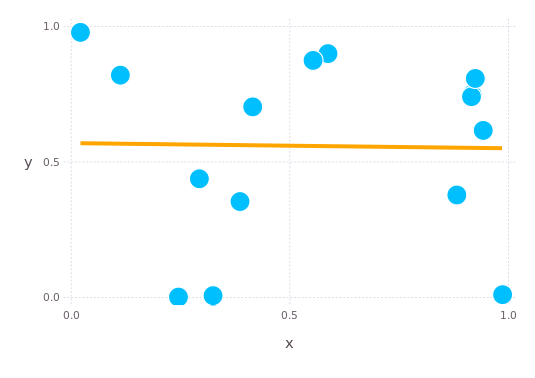

In [16]:
# Different colors for point and line by using different layers
# Changing the point size
plot(layer(x = xvals2, y = yvals2, Geom.point, Theme(default_point_size = 10px)),
layer(x = xvals2, y = yvals2, Geom.smooth(method = :lm), Theme(line_width = 4px, default_color = colorant"orange")))

## Adding titles and axes labels

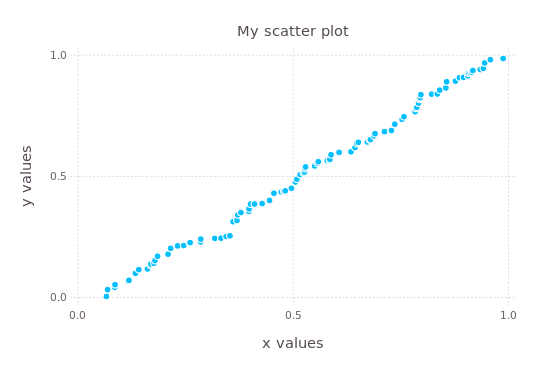

In [17]:
plot(x = sort(xvals), y = sort(yvals), Geom.point, 
Guide.title("My scatter plot"),
Guide.xlabel("x values"), Guide.ylabel("y values"))

## Saving a plot

In [17]:
# Use Cairo to save PNG files
using Cairo

In [18]:
# The Distribution package for random variables
using Distributions

In [18]:
# Using normal distribution
draw(PNG("myqqplot.png", 8inch, 6inch), plot(x = rand(Normal(), 100), y = Normal(), Stat.qq, Geom.point, Guide.title("QQ plot")))

LoadError: Normal not defined
while loading In[18], in expression starting on line 2

## Plotting from data

In [19]:
using DataFrames

In [20]:
# Importing a .csv file and using the semicolon to supress the output
df = readtable("GadflyTutorialData.csv");

In [21]:
# Looking at the last rows
# We note 200  row entries (patients)
# Gender, age, 4 variables and 3 categories
tail(df)

,Patient,Gender,Age,Variable1,Variable2,Variable3,Variable4,Category1,Category2,Category3
1,195,M,54,9.7,100,1.3,55,A,X,P
2,196,F,40,9.6,103,12.1,56,B,R,R
3,197,M,42,12.6,109,3.6,68,A,C,P
4,198,M,49,11.2,95,1.8,53,B,X,R
5,199,M,36,24.2,97,8.2,58,A,R,P
6,200,F,48,10.3,114,20.4,63,B,C,P


In [22]:
# Data types in each column
showcols(df)

200x10 DataFrame
| Col # | Name      | Eltype     | Missing |
|-------|-----------|------------|---------|
| 1     | Patient   | Int64      | 0       |
| 2     | Gender    | UTF8String | 0       |
| 3     | Age       | Int64      | 0       |
| 4     | Variable1 | Float64    | 0       |
| 5     | Variable2 | Int64      | 0       |
| 6     | Variable3 | Float64    | 0       |
| 7     | Variable4 | Int64      | 0       |
| 8     | Category1 | UTF8String | 0       |
| 9     | Category2 | UTF8String | 0       |
| 10    | Category3 | UTF8String | 0       |

In [23]:
# Describe each column
describe(df[:Gender])

Length  200
Type    UTF8String
NAs     0
NA%     0.0%
Unique  2


In [24]:
# From the Case-Control-Series Project lectures
# Count of number per group of gender
# Use the values for categorical data analysis
by(df, :Gender, d -> DataFrame(N = size(d, 1)))

,Gender,N
1,F,100
2,M,100


In [26]:
describe(df[:Age])

Summary Stats:
Mean:         45.805000
Minimum:      35.000000
1st Quartile: 40.000000
Median:       46.000000
3rd Quartile: 52.000000
Maximum:      55.000000


In [27]:
describe(df[:Variable1])

Summary Stats:
Mean:         17.051000
Minimum:      8.500000
1st Quartile: 12.675000
Median:       16.750000
3rd Quartile: 21.425000
Maximum:      24.900000


In [28]:
describe(df[:Variable2])

Summary Stats:
Mean:         100.025000
Minimum:      64.000000
1st Quartile: 93.750000
Median:       101.000000
3rd Quartile: 106.000000
Maximum:      125.000000


In [29]:
describe(df[:Variable3])

Summary Stats:
Mean:         10.414000
Minimum:      0.100000
1st Quartile: 3.375000
Median:       7.600000
3rd Quartile: 13.950000
Maximum:      77.900000


In [30]:
describe(df[:Variable4])

Summary Stats:
Mean:         59.715000
Minimum:      50.000000
1st Quartile: 54.000000
Median:       60.000000
3rd Quartile: 65.000000
Maximum:      70.000000


In [31]:
describe(df[:Category1])

Length  200
Type    UTF8String
NAs     0
NA%     0.0%
Unique  2


In [32]:
# Count of number per group of category 1
# Use the values for categorical data analysis
by(df, :Category1, d -> DataFrame(N = size(d, 1)))

,Category1,N
1,A,100
2,B,100


In [33]:
describe(df[:Category2])

Length  200
Type    UTF8String
NAs     0
NA%     0.0%
Unique  3


In [34]:
# Count of number per group of category 2
# Use the values for categorical data analysis
by(df, :Category2, d -> DataFrame(N = size(d, 1)))

,Category2,N
1,C,68
2,R,66
3,X,66


In [35]:
describe(df[:Category3])

Length  200
Type    UTF8String
NAs     0
NA%     0.0%
Unique  3


In [36]:
# Count of number per group of category 3
# Use the values for categorical data analysis
by(df, :Category3, d -> DataFrame(N = size(d, 1)))

,Category3,N
1,P,90
2,Q,44
3,R,66


### Boxplot

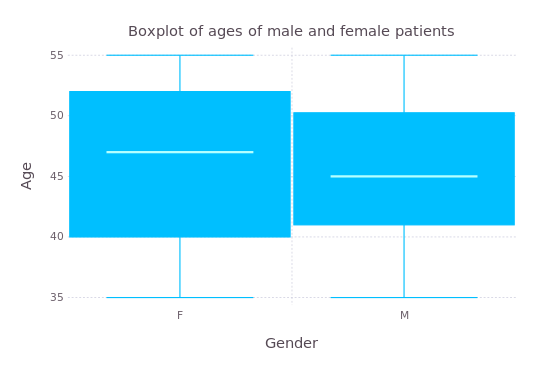

In [37]:
plot(df, x = "Gender", y = "Age", Geom.boxplot,
Guide.title("Boxplot of ages of male and female patients"),
Guide.xlabel("Gender"))

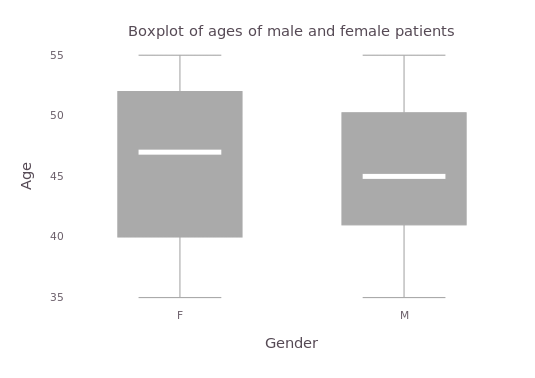

In [38]:
# Changing the size (stroke thickness) of the median line
# Change the color of the boxes and whiskers
# Increase the spacing between the boxes (making them thinner)
plot(df, x = "Gender", y = "Age", Geom.boxplot,
Guide.title("Boxplot of ages of male and female patients"),
Guide.xlabel("Gender"),
Theme(boxplot_spacing = 100px, grid_color = colorant"white", default_color = colorant"#AAAAAA", middle_width = 5px))

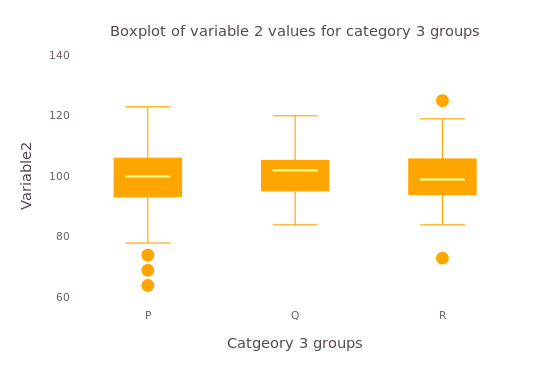

In [39]:
# Some more categories (by using Category 3
# Bigger outlier points
plot(df, x = "Category3", y = "Variable2", Geom.boxplot,
Guide.title("Boxplot of variable 2 values for category 3 groups"),
Guide.xlabel("Catgeory 3 groups"), Theme(default_color = colorant"orange",
grid_color = colorant"white", grid_color_focused = colorant"white",
boxplot_spacing = 80px, default_point_size = 7px))

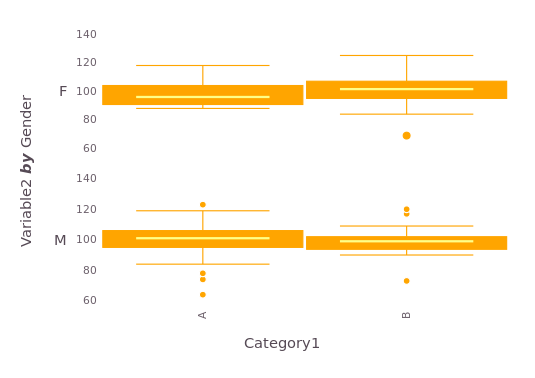

In [40]:
# Subplots to add another dimension to the plot
plot(df, ygroup = "Gender", x = "Category1", y = "Variable2", Geom.subplot_grid(Geom.boxplot),
Theme(default_color = colorant"orange",
grid_color = colorant"white", grid_color_focused = colorant"white"))

### Density
It's all about continuous variables on the *x*-axis

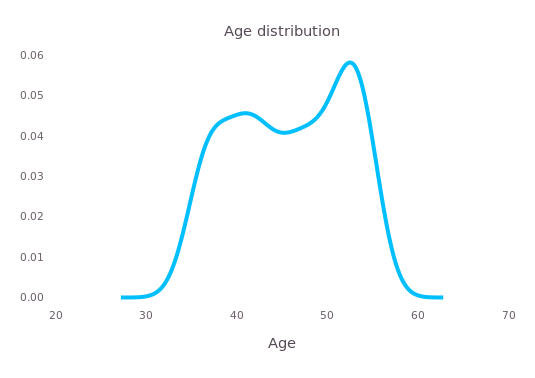

In [41]:
# Density estimate of ages
plot(df, x = "Age", Geom.density,
Guide.title("Age distribution"),
Theme(grid_color = colorant"white", grid_color_focused = colorant"white", line_width = 4px))

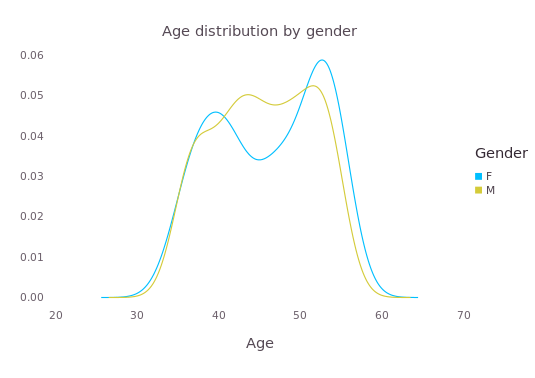

In [42]:
# Age distribution by group using the color argument
plot(df, x = "Age", color = "Gender", Geom.density,
Guide.title("Age distribution by gender"),
Theme(grid_color = colorant"white", grid_color_focused = colorant"white"))

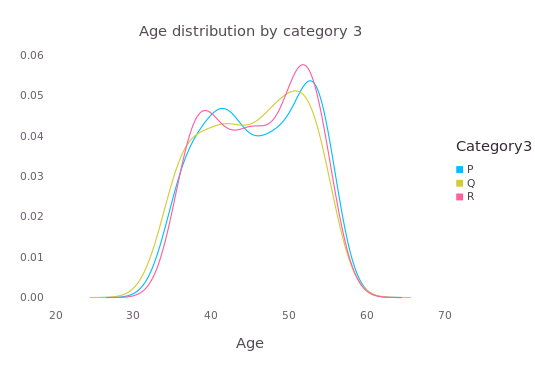

In [43]:
plot(df, x = "Age", color = "Category3", Geom.density,
Guide.title("Age distribution by category 3"),
Theme(grid_color = colorant"white", grid_color_focused = colorant"white"))

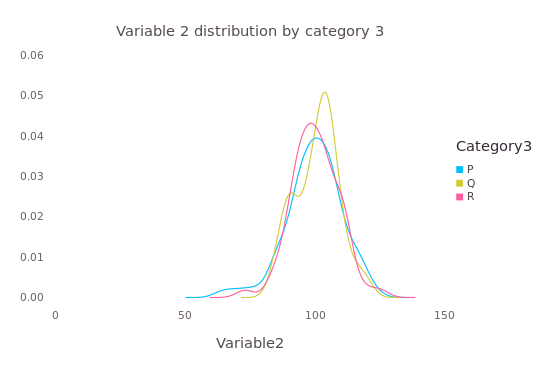

In [44]:
plot(df, x = "Variable2", color = "Category3", Geom.density,
Guide.title("Variable 2 distribution by category 3"),
Theme(grid_color = colorant"white", grid_color_focused = colorant"white"))

### Histogram
As with density estimates, its all about continuous variables on the *x*-axis

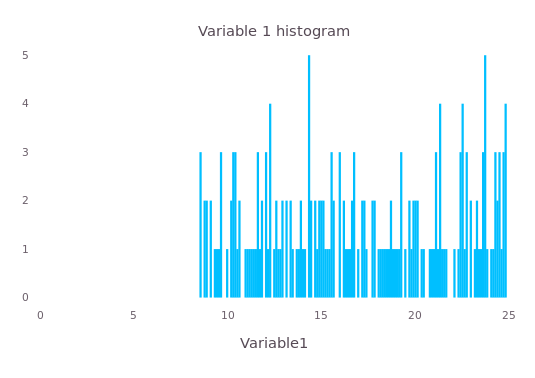

In [45]:
plot(df, x = "Variable1", Geom.histogram,
Guide.title("Variable 1 histogram"),
Theme(grid_color = colorant"white", grid_color_focused = colorant"white"))

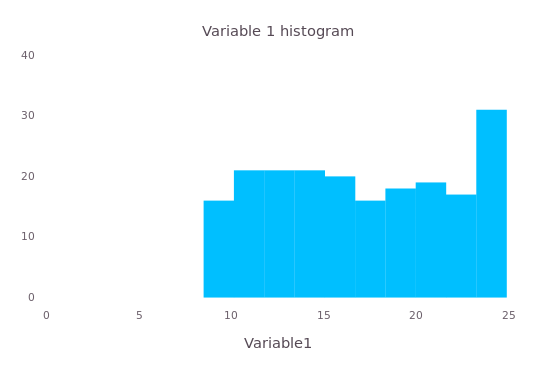

In [46]:
# Controlling the bincount
plot(df, x = "Variable1", Geom.histogram(bincount = 10),
Guide.title("Variable 1 histogram"),
Theme(grid_color = colorant"white", grid_color_focused = colorant"white"))

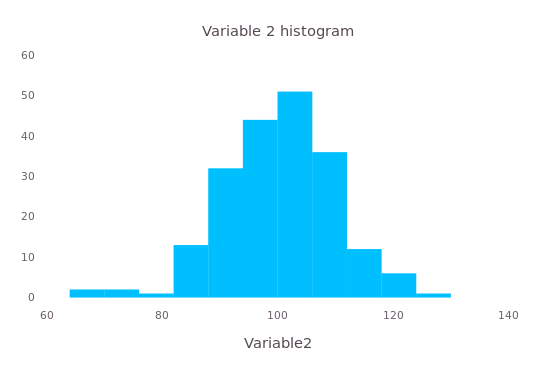

In [47]:
# A variable with a more normal distribution
plot(df, x = "Variable2", Geom.histogram(bincount = 11),
Guide.title("Variable 2 histogram"),
Theme(grid_color = colorant"white", grid_color_focused = colorant"white"))

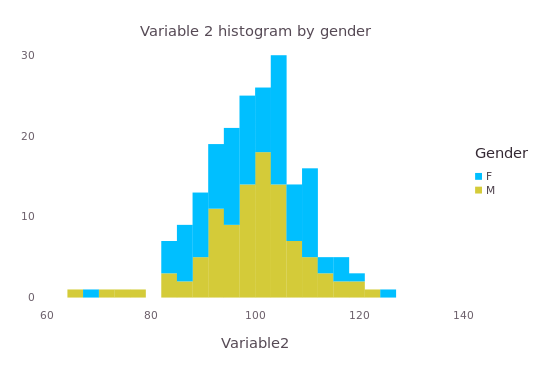

In [48]:
# An x-axis variable for more than one categorical groups
plot(df, x = "Variable2", color = "Gender", Geom.histogram(bincount = 21),
Guide.title("Variable 2 histogram by gender"),
Theme(grid_color = colorant"white", grid_color_focused = colorant"white"))

## Violin plots
Combining density estimates and box and whisker plots

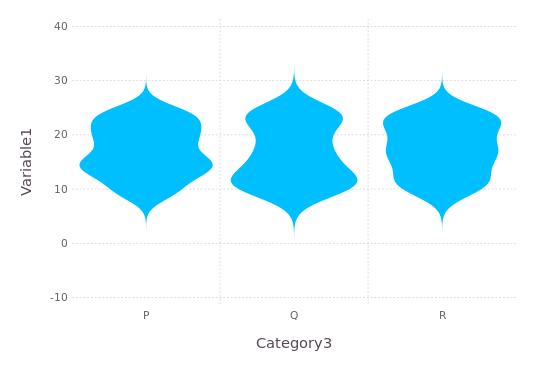

In [49]:
plot(df, x = :Category3, y = :Variable1, Geom.violin)

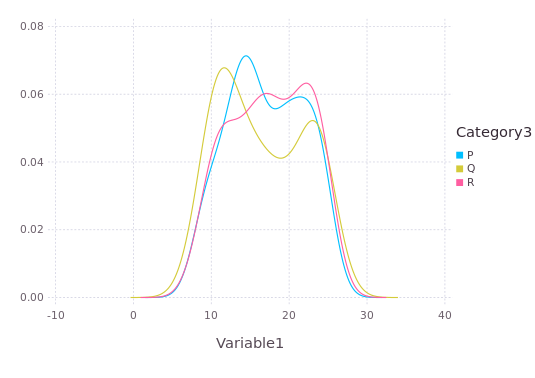

In [50]:
# Note how the shape is the same as the density plots
plot(df, x = :Variable1, color = :Category3, Geom.density)

### QQ plots
Visual help in deciding which type of statistical test to use

In [52]:
using Distributions

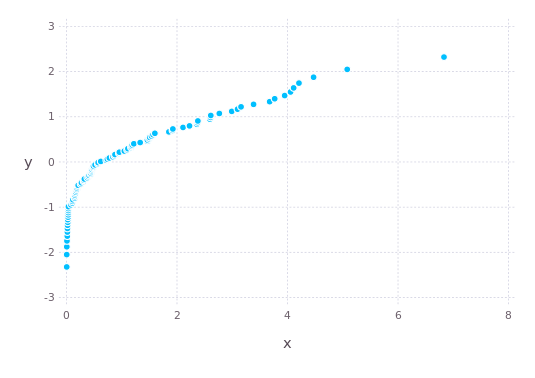

In [53]:
# These sample point were not from a population in which the underlying variable is
# normally distributed (cannot use non-parametric tests)
plot(x = rand(Chisq(1), 100), y = Normal(), Stat.qq, Geom.point)

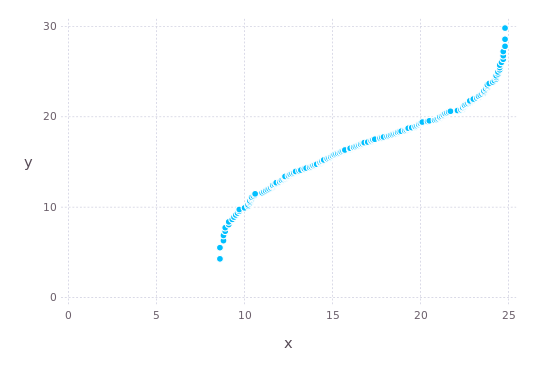

In [54]:
# Checking to see if variable 1 is from a sample in which the underlying population has that
# variable normally distributed
plot(x = sort(df[:Variable1]), y = Normal(mean(df[:Variable1]), std(df[:Variable1])), Stat.qq, Geom.point)

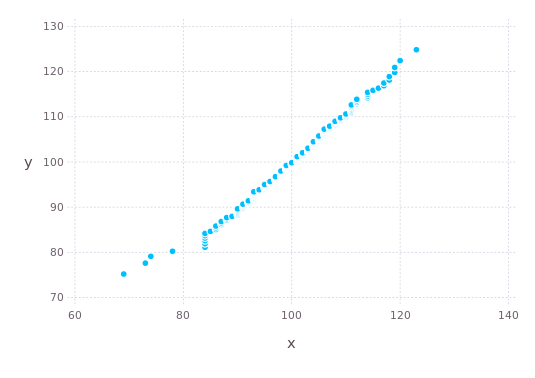

In [55]:
# Variable 2
plot(x = sort(df[:Variable2]), y = Normal(mean(df[:Variable2]), std(df[:Variable2])), Stat.qq, Geom.point)

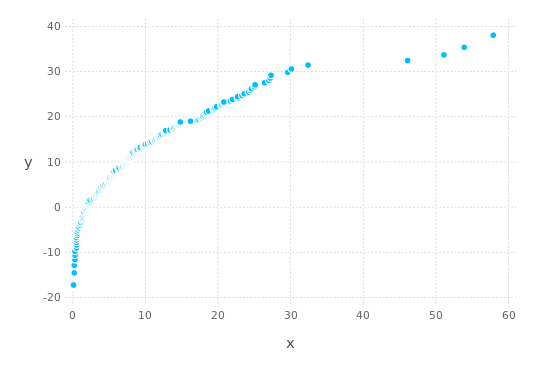

In [56]:
# Variable 3
plot(x = sort(df[:Variable3]), y = Normal(mean(df[:Variable3]), std(df[:Variable3])), Stat.qq, Geom.point)

### Scatter plots

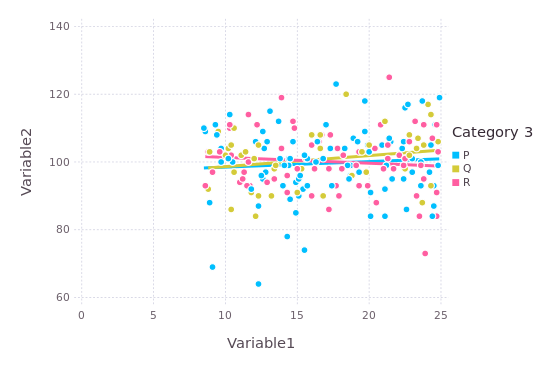

In [57]:
# Setting the title for the graph key (legend)
plot(df, x = "Variable1", y ="Variable2", color = "Category3",
Geom.point, Geom.smooth(method = :lm), Guide.colorkey("Category 3"), Theme(line_width = 3px))

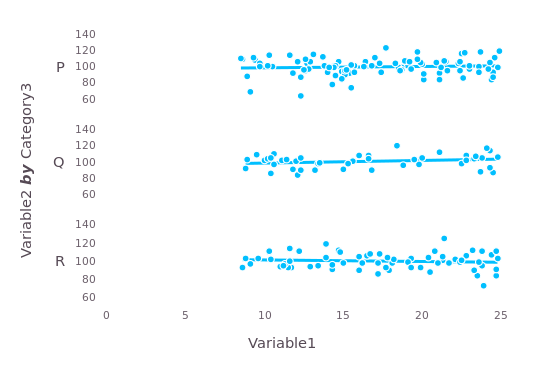

In [58]:
# Subplots to add another dimension to the plot
plot(df, ygroup = "Category3", x = "Variable1", y = "Variable2", Geom.subplot_grid(Geom.point, Geom.smooth(method = :lm)),
Theme(grid_color = colorant"white", line_width = 3px))

## Vertical and horizontal lines

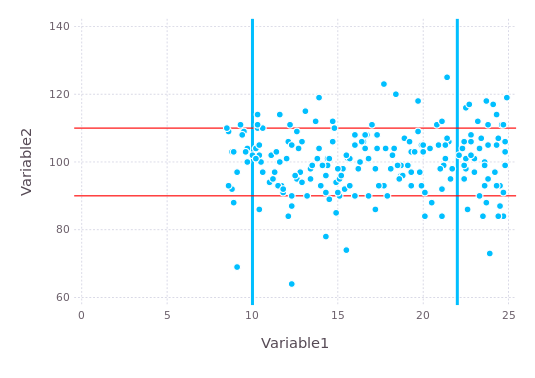

In [59]:
# Drawing two vertical and two horizontal lines
# Adding size and color
plot(df, x = "Variable1", y = "Variable2", yintercept = [90, 110], Geom.point, Geom.hline(color = colorant"Red"),
xintercept = [10, 22], Geom.vline(size = 3px))

## More examples

### Step lines

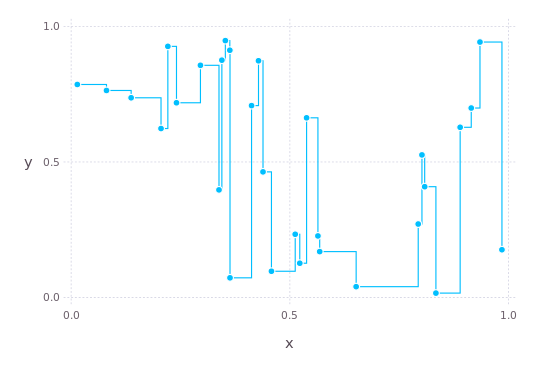

In [60]:
# Horizontal then vertical
x = rand(30)
y = rand(30)
plot(x = x, y = y, Geom.point, Geom.step(direction = :hv))

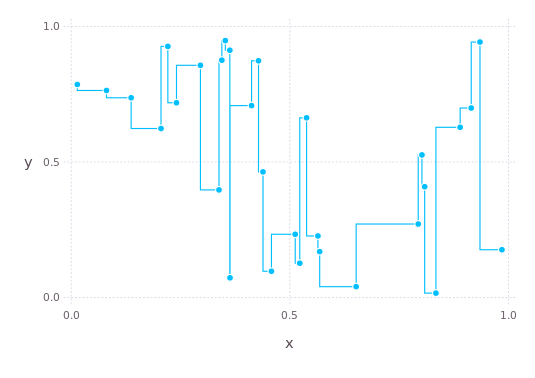

In [61]:
# Vertical then horizontal
plot(x = x, y = y, Geom.point, Geom.step(direction = :vh))

### Beeswarm

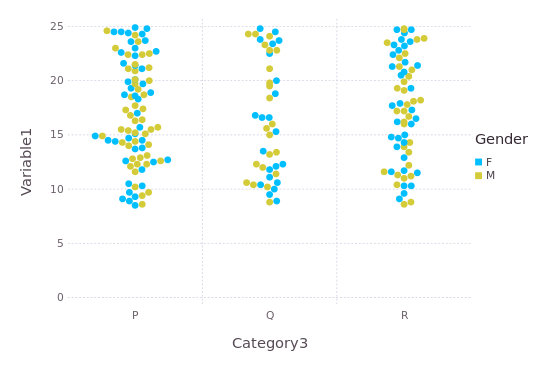

In [62]:
plot(df, x = :Category3, y = :Variable1, color = :Gender, Geom.beeswarm)

### Continuous color scales

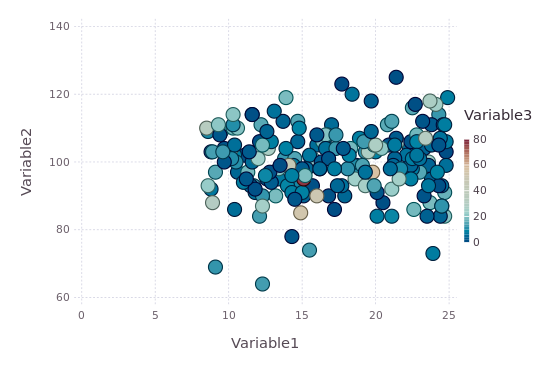

In [63]:
plot(df, x = :Variable1, y = :Variable2, color = :Variable3,
Scale.color_continuous(minvalue = minimum(df[:Variable3]), maxvalue = maximum(df[:Variable3])),
Theme(default_point_size = 7px))

### Manually choosing colors

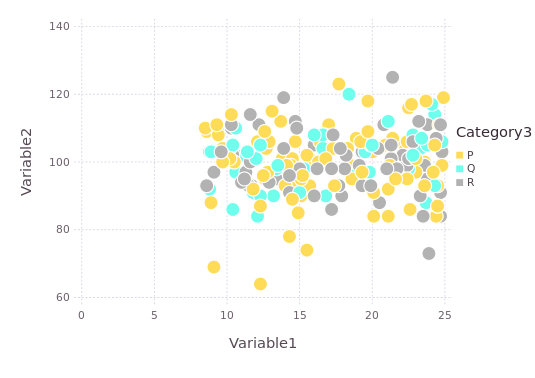

In [62]:
plot(df, x = :Variable1, y = :Variable2, color = :Category3, Geom.point,
Scale.color_discrete_manual(colorant"#FFDC57", colorant"#6EFFED", colorant"#B2B2B2"),
Theme(default_point_size = 7px))

### Another way of getting rid of grid lines

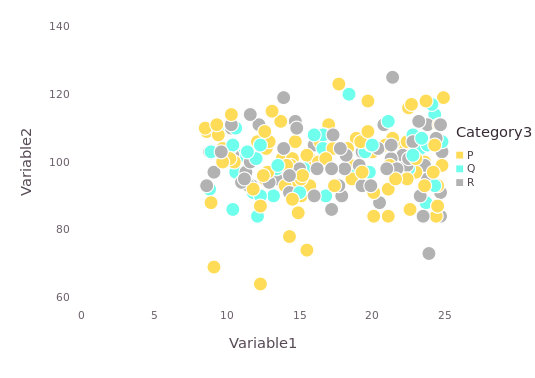

In [63]:
plot(df, x = :Variable1, y = :Variable2, color = :Category3, Geom.point,
Scale.color_discrete_manual(colorant"#FFDC57", colorant"#6EFFED", colorant"#B2B2B2"),
Theme(default_point_size = 7px, grid_line_width = 0px))